<a href="https://colab.research.google.com/github/DamirDenis-Tudor/2d-tank-simulator/blob/master/w1_1_2026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**CV2026 - Week 1**

For questions use discord **[andreiarhire]**

**Rules**

* Each session will include a set of demos used to observe some of the applications seen in the lecture. Make sure you can play with them! They will be provided before the lab starts.  

* Each session will start with a set of questions you are supossed to prepare answers for. The set of answers must be uploaded to GitHub as a release (named release_sessionNumber) before the next lab starts. After the deadline, a 50% penalty will be applied. Some of the questions will be follow-ups on the provided demos, so don't be shy to reuse some of the codes whenever possible.

* Each question comes with a number of base points (bp). The final grade for the lab will be TotalNrPoints / MaxPoints * 10. MaxPoints will be the maximum number of points achieved by a student of this class.  

* For direct messaging and discussions feel free to join this [Discord server](https://discord.gg/4SZ4xjMg).


EXERCISES

**1bp** 1. Given a (h, w, 3) image convolved with a K x K filter, compute the number of flops needed to compute the convolution operation (excluding flops needed for the incrementation of indices).

**2bp** 2. Current CPUs provide optimizations of their Instruction Set for DSP
applications. Provide your CPU model and check its support for FMA operations.
Does your CPU implement AVX? What would be the expected speed-up with a 4xFMA ALU option, compared to the answer of the previous question?

**1bp** 3. Compare different sorting algorithms for the median filter implementation. What is the time complexity of every variation you proposed?

**2bp** 4. Provide an advantage and one disadvantage of the median filter compared to the average filter. Explain your proposals.

**2bp** 5. Using the Fast Fourier Transform, implement the operations needed to apply a low-pass filter, a band-pass filter and a high-pass filter. Provide the filtered outputs and explain the effects. What is the advantage of applying filtering in the Fourier Domain?

## Exercise 1

To compute the convolution of a `(h, w, 3)` image with a $K \times K$ filter (assuming a $K \times K \times 3$ kernel to match the image channels):
* **Multiplications per pixel:** $3 \cdot K^2$
* **Additions per pixel:** $3 \cdot K^2 - 1$
* **Total FLOPs per pixel:** $6K^2 - 1$
* **Total FLOPs for the image:** $h \cdot w \cdot (6K^2 - 1)$

## Exercise 2

- The "Fused" Part (FMA): Usually, a CPU has to do a multiplication ($a \times b$), save that result, and then do an addition ($+ c$). An FMA (Fused Multiply-Add) unit "fuses" these into a single step, doing both in one clock cycle.
- The "4x" Part (Vectorization): Modern CPUs use SIMD (Single Instruction, Multiple Data) to process "vectors" of numbers at once. A 4xFMA unit has four parallel lanes, meaning it can calculate four different $a \times b + c$ operations at the exact same time.
- Think of it this way: to get the same result on a basic CPU, you’d need 8 separate instructions (4 multiplies followed by 4 additions). Since the 4xFMA unit finishes all of that in just 1 cycle, you get a theoretical 8x boost in speed.

In [8]:

!echo "CPU Model:"
!cat /proc/cpuinfo | grep 'model name' | head -1
!echo -e "\nSupported Flags (Looking for 'avx' and 'fma'):"
!cat /proc/cpuinfo | grep 'flags' | head -1 | grep -o 'avx[^ ]*\|fma[^ ]*'



CPU Model:
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz

Supported Flags (Looking for 'avx' and 'fma'):
fma
avx
avx2


## Exercise 3

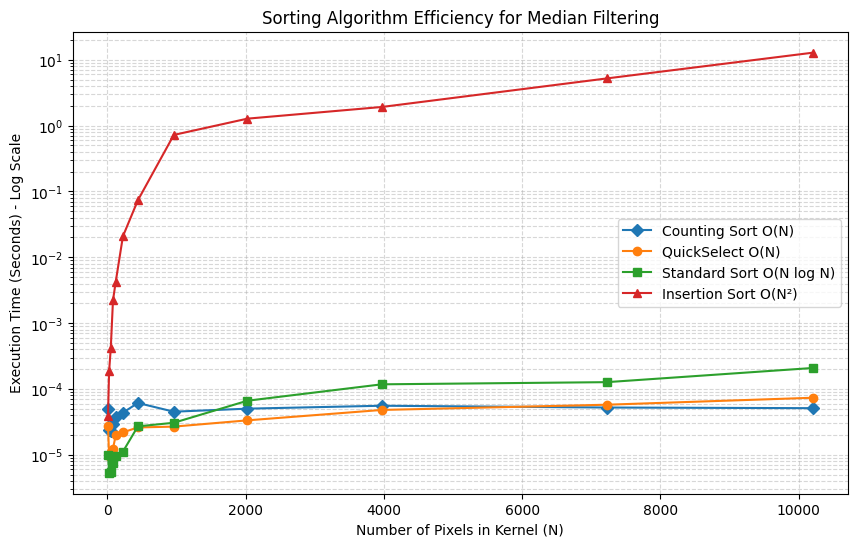

In [19]:
import numpy as np
import time
import matplotlib.pyplot as plt

def benchmark_cv_sorting():
    # Kernel sizes KxK -> N pixels
    k_sizes = [3, 5, 7, 9, 11, 15, 21, 31, 45, 63, 85, 101]
    n_pixels = [k*k for k in k_sizes]

    results = {'CountingSort': [], 'QuickSelect': [], 'StandardSort': [], 'InsertionSort': []}

    for n in n_pixels:
        # Simulate 8-bit image data (0-255)
        data = np.random.randint(0, 256, n)

        # 1. Counting Sort (O(N + Range)) - Manual Histogram implementation
        start = time.perf_counter()
        counts = np.bincount(data, minlength=256)
        cumulative = np.cumsum(counts)
        median_idx = (n + 1) // 2
        _ = np.searchsorted(cumulative, median_idx)
        results['CountingSort'].append(time.perf_counter() - start)

        # 2. QuickSelect (O(N) average)
        start = time.perf_counter()
        _ = np.partition(data, n // 2)[n // 2]
        results['QuickSelect'].append(time.perf_counter() - start)

        # 3. Standard Sort (O(N log N))
        start = time.perf_counter()
        _ = np.sort(data)[n // 2]
        results['StandardSort'].append(time.perf_counter() - start)

        # 4. Insertion Sort (O(N^2))
        def i_sort(arr):
            for i in range(1, len(arr)):
                key, j = arr[i], i - 1
                while j >= 0 and key < arr[j]:
                    arr[j + 1] = arr[j]
                    j -= 1
                arr[j + 1] = key
            return arr[len(arr)//2]

        start = time.perf_counter()
        _ = i_sort(data.copy())
        results['InsertionSort'].append(time.perf_counter() - start)

    # Visualization
    plt.figure(figsize=(10, 6))
    plt.plot(n_pixels, results['CountingSort'], 'D-', label='Counting Sort O(N)')
    plt.plot(n_pixels, results['QuickSelect'], 'o-', label='QuickSelect O(N)')
    plt.plot(n_pixels, results['StandardSort'], 's-', label='Standard Sort O(N log N)')
    plt.plot(n_pixels, results['InsertionSort'], '^-', label='Insertion Sort O(N²)')

    plt.yscale('log')
    plt.title('Sorting Algorithm Efficiency for Median Filtering')
    plt.xlabel('Number of Pixels in Kernel (N)')
    plt.ylabel('Execution Time (Seconds) - Log Scale')
    plt.legend()
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.show()

benchmark_cv_sorting()

## Exercise 4

In computer vision, the choice between a Median Filter and an Average (Mean) Filter depends on the noise type and the need for edge preservation.

1. Advantage: Edge Preservation & Impulse Noise Removal
- The median filter is superior at removing salt-and-pepper noise while keeping object boundaries sharp.
- An average filter calculates the arithmetic mean, which causes a single noisy pixel (e.g., a white "255" in a dark area) to be smeared across its neighbors, resulting in a blurred image. A median filter sorts the values and picks the middle one; since an outlier is at the extreme end of the list, it is discarded. Because it selects an actual pixel value rather than calculating a new one, the edges do not "blend."

2. Disadvantage: Computational Complexity
- The median filter is significantly slower to compute than the average filter.
- To compute an average, the CPU only needs to perform simple additions and one division ($O(N)$ complexity). To compute a median, the CPU must perform a sorting or selection operation (typically $O(N \log N)$ or $O(N)$ with higher constant overhead). In high-resolution, real-time video applications, the sorting requirement of the median filter can become a major bottleneck compared to the "sum and divide" nature of the average filter.

## Exercise 5

In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


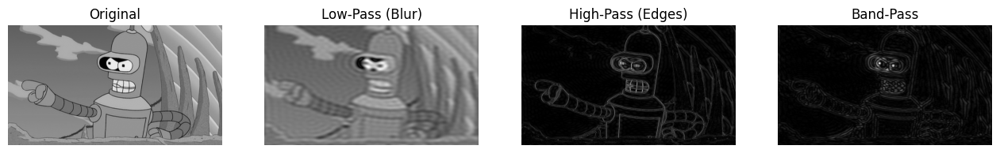

In [17]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Load the image and convert to grayscale
bender_img = cv.imread("/content/drive/MyDrive/Master I/Computer Vision/lab1/bender.png", 0)

# 2. Compute the 2D FFT and shift the zero frequency to the center
dft = np.fft.fft2(bender_img)
dft_shift = np.fft.fftshift(dft)

rows, cols = bender_img.shape
crow, ccol = rows // 2, cols // 2

# 3. Create Filtering Masks
# Low-Pass: Allows center frequencies (smoothness)
lpf_mask = np.zeros((rows, cols), np.uint8)
cv.circle(lpf_mask, (ccol, crow), 30, 1, -1)

# High-Pass: Blocks center frequencies (edges)
hpf_mask = np.ones((rows, cols), np.uint8)
cv.circle(hpf_mask, (ccol, crow), 30, 0, -1)

# Band-Pass: Allows a specific ring of frequencies
bpf_mask = np.zeros((rows, cols), np.uint8)
cv.circle(bpf_mask, (ccol, crow), 60, 1, -1)
cv.circle(bpf_mask, (ccol, crow), 20, 0, -1)

# 4. Apply Masks and Inverse FFT
def apply_filter(mask):
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    return np.abs(img_back)

img_lpf = apply_filter(lpf_mask)
img_hpf = apply_filter(hpf_mask)
img_bpf = apply_filter(bpf_mask)

# 5. Visualization
plt.figure(figsize=(16, 8))
titles = ['Original', 'Low-Pass (Blur)', 'High-Pass (Edges)', 'Band-Pass']
images = [bender_img, img_lpf, img_hpf, img_bpf]

for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.show()

1. Effects of the Filters
- Low-Pass Filter (LPF): By keeping only the center of the Fourier spectrum (low frequencies), we remove rapid intensity changes. This results in a blurred or smoothed version of Bender, effectively removing high-frequency noise.
- High-Pass Filter (HPF): By blocking the center and keeping the outer frequencies, we remove slow-changing gradients. This captures edges and fine details, leaving the flat areas of the image black.
- Band-Pass Filter (BPF): This acts as a "tuned" filter, isolating a specific range of frequencies. It removes both the very coarse structures (DC component) and the very fine noise, highlighting textures or specific edge scales.

2. Advantages of the Fourier Domain
- Computational Efficiency: In the spatial domain, a large convolution kernel of size $K \times K$ has a complexity of $O(K^2 \cdot N)$. In the Fourier Domain, convolution becomes simple element-wise multiplication. Using the FFT, the complexity is reduced to $O(N \log N)$, which is significantly faster for large filters.
- Global Frequency Control: It allows us to isolate specific periodic patterns or noise (like scan lines in an old video) that are very difficult to target using local spatial kernels.
- Filter Design: Some filters, such as the Ideal filter or the Butterworth filter, are much easier to define and manipulate mathematically as geometric shapes (circles/rings) in the frequency spectrum than as matrix weights in the spatial domain

**1. Image manipulation and processing**

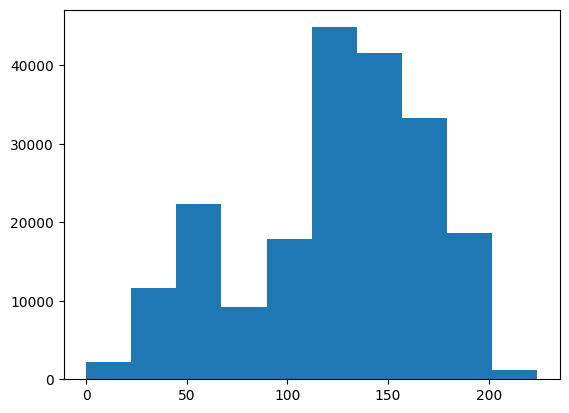

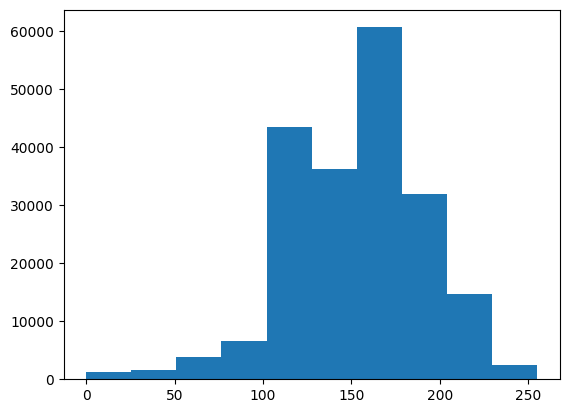

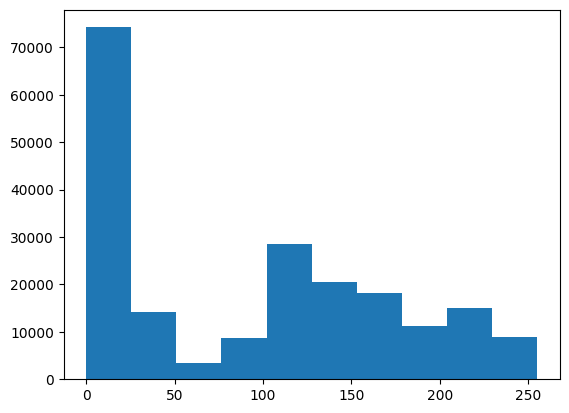

In [16]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

bender_img = cv.imread("/content/drive/MyDrive/Master I/Computer Vision/lab1/bender.png")

b, g, r = cv.split(bender_img)

plt.hist(b.flatten())
plt.show()
plt.hist(g.flatten())
plt.show()
plt.hist(r.flatten())
plt.show()

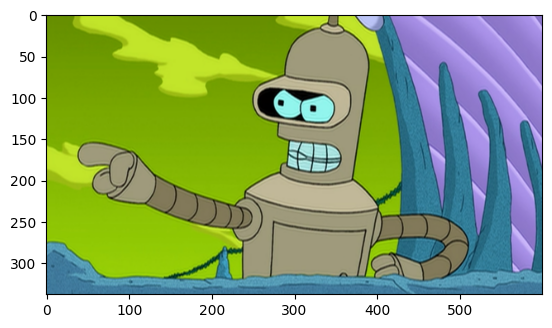

In [ ]:
plt.imshow(bender_img)

**2. Image channels manipulation**

The image comes in BGR format, so we can split the chanels to plot each channel separately

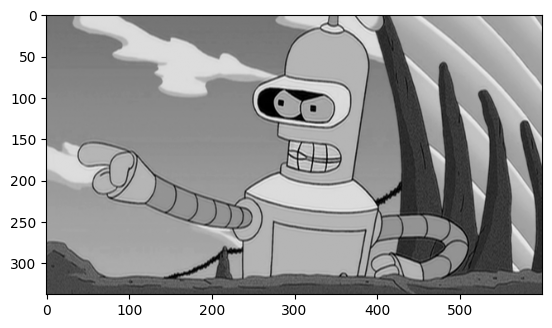

In [ ]:
b, g, r = cv.split(bender_img)
bender_img_rgb = cv.merge([r, g, b])

plt.imshow(b, 'gray')

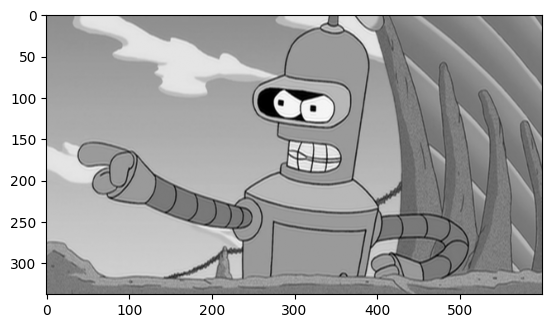

In [ ]:
plt.imshow(g, 'gray')

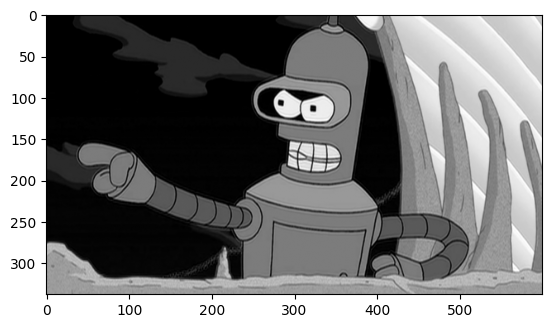

In [ ]:
plt.imshow(r, 'gray')

**3. Transformation between different representations**

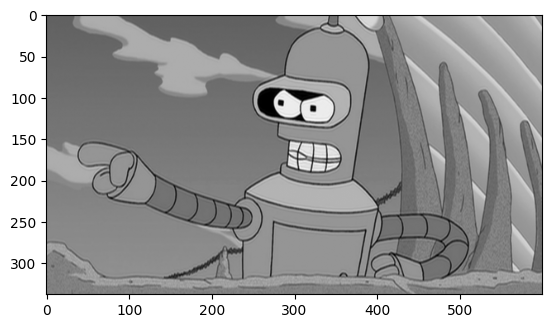

In [ ]:
grayImg = cv.cvtColor(bender_img, cv.COLOR_BGR2GRAY) # transform BGR image to gray scale image
plt.imshow(grayImg,cmap='gray')


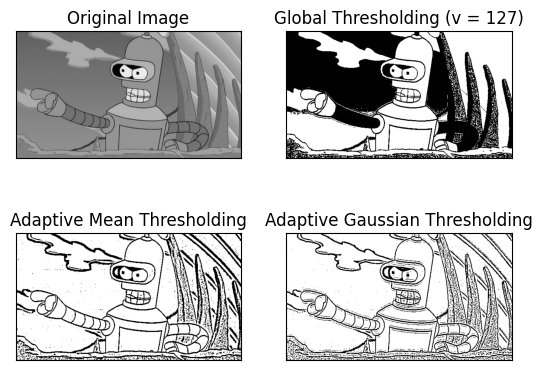

In [ ]:
#Transform image from multiple level of gray to binary image
ret,th1 = cv.threshold(grayImg,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(grayImg,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(grayImg,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [grayImg, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

**4. Image manipulation**

#Affine Image Transformations

Affine transformations are geometric operations that preserve parallel lines, ratios of distances, and angles. These transformations include translation, rotation, scaling, and shearing.






###Affine Transformation Matrix

An affine transformation can be represented using a transformation matrix. In 2D, the affine transformation matrix is denoted as $M$:

$$
M = \begin{bmatrix}
a & b & c \\
d & e & f \\
0 & 0 & 1 \\
\end{bmatrix}
$$

where $a$ and $e$ are scaling factors, $b$ and $d$ are shearing factors, and $c$ and $f$ are translation factors.

<class 'numpy.ndarray'>


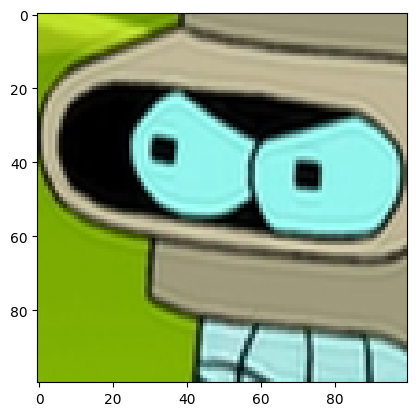

In [ ]:
#Crop a piece of image
print(type(bender_img))
cropped = bender_img[70:170, 250:350]
plt.imshow(cropped)

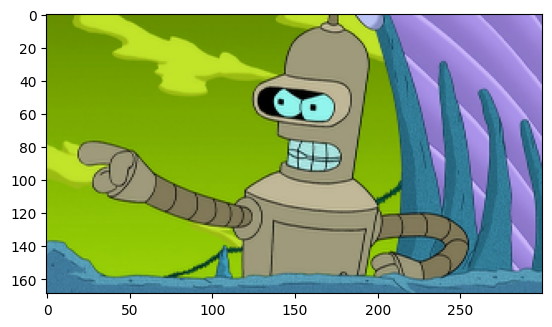

In [ ]:
dim = (300,169)
# Resize image to dim using cubic interpolation
res = cv.resize(bender_img, dim, interpolation=cv.INTER_CUBIC)
plt.imshow(res)

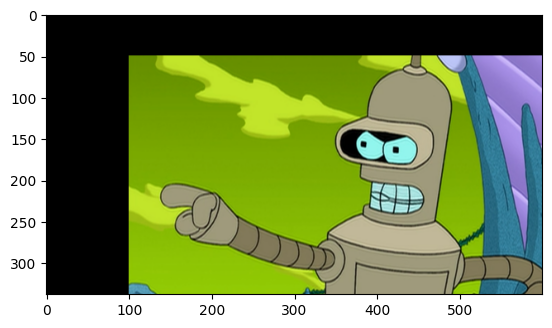

In [ ]:
rows,cols = bender_img.shape[:2] # Getting the shape of the image
M = np.float32([[1,0,100],[0,1,50]]) # Parameters of the translation<class 'numpy.ndarray'>
dst = cv.warpAffine(bender_img,M,(cols,rows)) # Translation of a image
plt.imshow(dst)

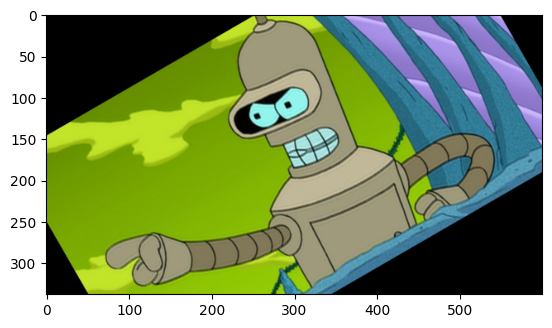

In [ ]:
M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),30,1) # Angle of the rotation with respect to center of image
dst = cv.warpAffine(bender_img,M,(cols,rows)) # Rotate the image
plt.imshow(dst)

**5. Pyramid representation of images**

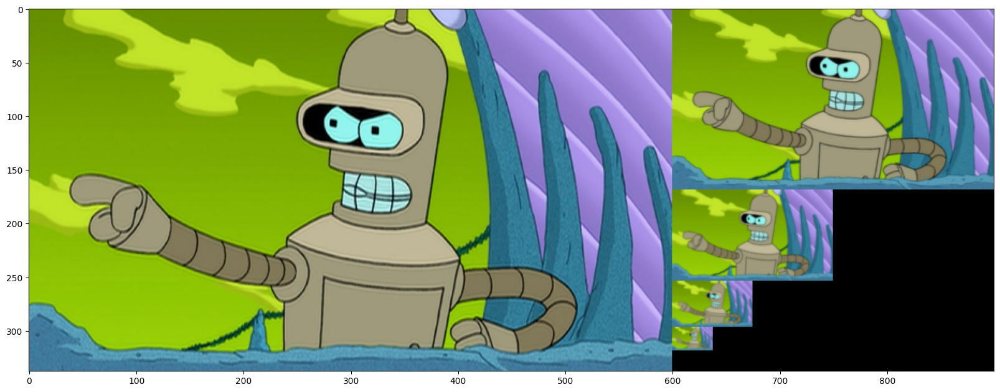

In [ ]:
layer = bender_img.copy()

rows, cols, dim = layer.shape
composite_image = np.zeros((rows, cols + cols // 2, 3), dtype=np.uint8)

composite_image[:rows, :cols, :] = layer
i_row = 0

for i in range(4):
    # using pyrDown() function
    layer = cv.pyrDown(layer)
    n_rows, n_cols = layer.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = layer
    i_row += n_rows

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(composite_image)
plt.show()

**6. Contrast enhancement**


Text(0.5, 1.0, 'Enhanced image')

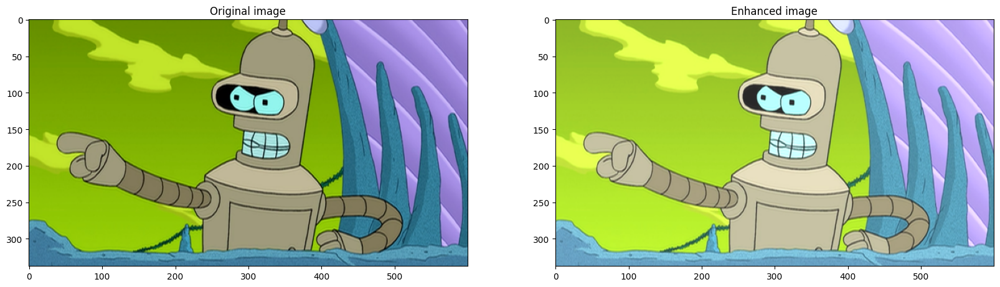

In [ ]:
# Contrast/brightness change
img = bender_img.copy()
new_image = np.zeros(img.shape, img.dtype)
alpha = 1.0 # Simple contrast control value [1.0-3.0]
beta = 40    # Simple brightness  value [0-100]

for y in range(img.shape[0]):
    for x in range(img.shape[1]):
        for c in range(img.shape[2]):
            new_image[y,x,c] = np.clip(alpha*img[y,x,c] + beta, 0, 255)

fig, ax = plt.subplots(1,2,figsize=(20, 20))
ax[0].imshow(img)
ax[0].set_title('Original image')
ax[1].imshow(new_image)
ax[1].set_title('Enhanced image')

**7. Gamma correction**


Text(0.5, 1.0, 'Gamma correction')

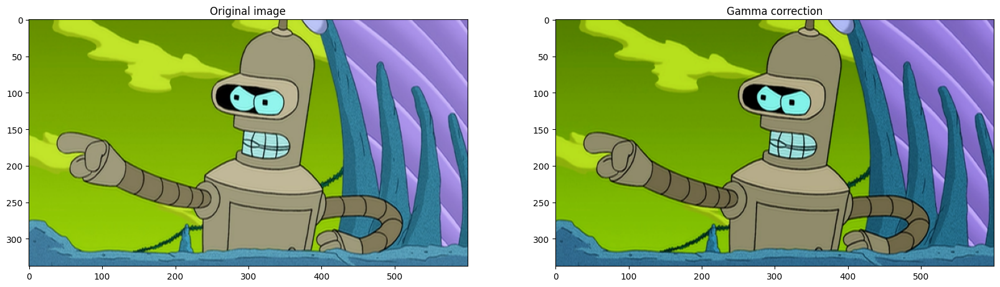

In [ ]:
lookUpTable = np.empty((1,256), np.uint8)
gamma = 1.2
for i in range(256):
  lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
res = cv.LUT(img, lookUpTable)

fig, ax = plt.subplots(1,2,figsize=(20, 20))
ax[0].imshow(img)
ax[0].set_title('Original image')
ax[1].imshow(res)
ax[1].set_title('Gamma correction')

**8. Image histogram**

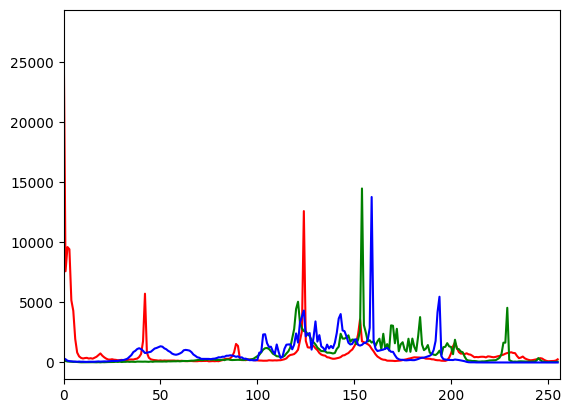

In [ ]:
color = ('r','g','b')
for i,col in enumerate(color):
    histr = cv.calcHist([bender_img_rgb],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

###Histogram Equalization

Histogram equalization is a method used in image processing to enhance the contrast of an image by redistributing the intensity values. The process involves transforming the intensity distribution of the image such that it has a uniform distribution.

Let's denote:
* $I_{\text{in}}$ - Input image (a matrix of pixel intensities)
* $H(I_{\text{in}})$ - Histogram of the input image $I_{\text{in}}$
* $CDF(I_{\text{in}})$ - Cumulative distribution function of the input image $I_{\text{in}}$
* $I_{\text{out}}$ - Equalized image (a matrix of pixel intensities)
* $H(I_{\text{out}})$ - Histogram of the equalized image $I_{\text{out}}$


The process of histogram equalization can be mathematically expressed as follows:

1. Compute Histogram
 $$ H(I_{\text{in}}) = \text{histogram}(I_{\text{in}}) $$

2. Compute Cumulative Distribution Function (CDF)
$$CDF(I_{\text{in}}) = \text{cumulative sum of } H(I_{\text{in}}) $$

3. Normalize CDF
$$CDF_{\text{normalized}}(I_{\text{in}}) = \frac{{CDF(I_{\text{in}})}}{{\text{max}(CDF(I_{\text{in}}))}} $$

4. Perform Histogram Equalization
$$ I_{\text{out}} = \text{interp}(I_{\text{in}}, \text{bins}[:-1], CDF_{\text{normalized}}(I_{\text{in}}) \times 255) $$
Here, $interp$
 is a function that performs interpolation.
$bins[:−1]$ represents the bins used in histogram computation.
5. Reshape Output Image
$$ I_{\text{out}} = \text{reshape}(I_{\text{out}}, \text{shape}(I_{\text{in}})) $$





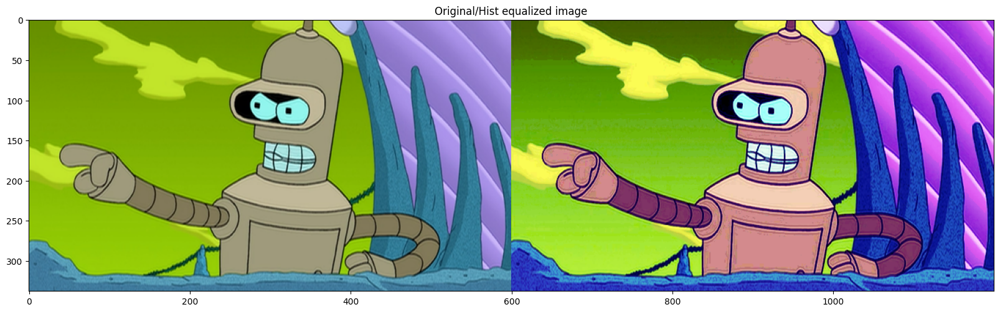

In [ ]:
# Histogram equalize
d1 = cv.equalizeHist(img[:,:,0])
d2 = cv.equalizeHist(img[:,:,1])
d3 = cv.equalizeHist(img[:,:,2])
equ = cv.merge([d1,d2,d3])
res = np.hstack((img,equ))
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(res)
ax.set_title('Original/Hist equalized image')
plt.show()

###Histogram matching

The histogram matching algorithm aims to match the histogram of image $A$ to the histogram of image $B$. Given two images $A$ and $B$, we follow these steps:

1.   Convert Images to Grayscale:

  Convert both images $A$ and $B$ to grayscale images, denoted as $A_g$ and $B_g$ respectively.
  
2.   Compute Histograms:
  Compute the histograms $H_A$ and $H_B$ of the grayscale images $A_g$ and $B_g$ respectively. The histograms represent the distribution of pixel intensities.
$$
H_A(i) = n_i, \quad i \in [0,255]
$$
$$
H_B(j) = m_j, \quad j \in [0,255]
$$
Where $n_i$ and $m_j$ represent the number of pixels with intensity $i$ in image $A_g$ and intensity $j$ in image $B_g$ respectively.

3. Compute Cumulative Distribution Functions (CDFs):
Compute the cumulative distribution functions (CDFs) $CDF_A$ and $CDF_B$ of the histograms $H_A$ and $H_B$ respectively.
$$
CDF_A(i) = \sum_{k=0}^{i} n_k, \quad i \in [0,255]
$$
$$
CDF_B(j) = \sum_{k=0}^{j} m_k, \quad j \in [0,255]
$$
Where $CDF_A(i)$ and $CDF_B(j)$ represent the cumulative sum of pixel counts up to intensity $i$ in image $A_g$ and intensity $j$ in image $B_g$ respectively.
4. Normalize CDFs:
Normalize the CDFs $CDF_A$ and $CDF_B$ to the range $[0, 1]$.
$$
CDF_A'(i) = \frac{{CDF_A(i)}}{{\max(CDF_A)}}, \quad i \in [0,255]
$$
$$
CDF_B'(j) = \frac{{CDF_B(j)}}{{\max(CDF_B)}}, \quad j \in [0,255]
$$
5. Histogram Matching:
Match the histogram of image $A_g$ to the histogram of image $B_g$ by applying histogram equalization. For each pixel intensity $i$ in image $A_g$, map it to the intensity $j$ in image $B_g$ such that $CDF_A'(i) = CDF_B'(j)$.

$$
\text{{Matched intensity}}(i) = \text{{interp}}(i, \text{{bins}}, CDF_B')
$$

  Where $\text{{interp}}(x, \text{{bins}}, \text{{CDF}})$ represents linear interpolation of $x$ with respect to the bins and the normalized CDF.
6. Reshape and Output:

  Reshape the matched intensity values to the dimensions of image $A_g$ to obtain the matched image $A'_g$.







**9. Histogram matching**

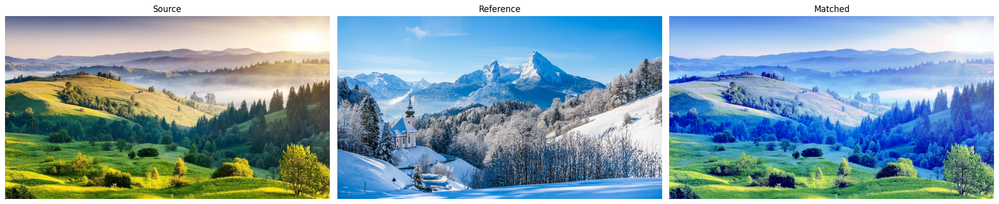

In [ ]:
from skimage import exposure
from skimage.exposure import match_histograms
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread("/content/drive/MyDrive/CAVA_2026/teaching/week1/imgs/a.jpg")
reference = cv.imread("/content/drive/MyDrive/CAVA_2026/teaching/week1/imgs/b.jpg")

img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
reference = cv.cvtColor(reference, cv.COLOR_BGR2RGB)

matched = match_histograms(img, reference, channel_axis=-1)

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(20, 20), sharex=True, sharey=True)
for aa in (ax1, ax2, ax3):
    aa.set_axis_off()

ax1.imshow(img)
ax1.set_title('Source')
ax2.imshow(reference)
ax2.set_title('Reference')
ax3.imshow(matched)
ax3.set_title('Matched')

plt.tight_layout()
plt.show()


**10. Image filtering - 'convolution'**

In [ ]:
def cumsum_prod(a, b):
  return np.sum(a * b)


def generic_convolution(input_image, correlation_filter, agg_function):
  h, w = input_image.shape
  h_c, w_c = correlation_filter.shape

  d_h = h_c // 2
  d_w = w_c // 2

  # padding is needed such that in your iterative procedure you don't have negative indices or indices
  # outside the image
  oper_image = np.zeros((h + 2 * d_h, w + 2 * d_w))
  # insert the input image in the center of the padded image, such that you will
  # have a 0-border with a height h_c // 2 and a width w_c // 2
  oper_image[d_h:(h + d_h), d_w:(w + d_w)] = input_image
  output_img = np.zeros((h, w))

  for i in range(h):
    for j in range(w):
      # compute the values of the index of the corners of your local patch
      l_i = i
      l_j = j
      r_i = i + 2 * (h_c // 2)
      r_j = j + 2 * (w_c // 2)

      # extract the patch and apply the agg function
      # the aggregation here is the sum of the elementwise multiplication between the filter and the local patch
      patch = oper_image[l_i: r_i + 1, l_j: r_j + 1]
      output_img[i, j] = agg_function(patch, correlation_filter)

  return output_img



In [ ]:
plt.rcParams["figure.figsize"] = (25, 5)

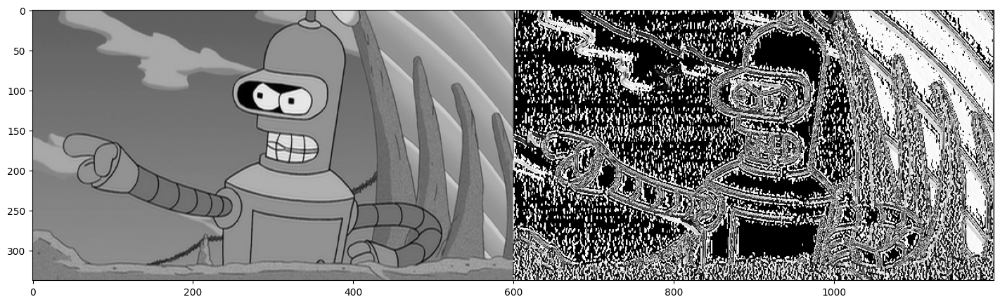

In [ ]:
bender_img = cv.imread("/content/drive/MyDrive/CAVA_2026/teaching/week1/imgs/bender.png")
bender_img_gray = cv.cvtColor(bender_img, cv.COLOR_BGR2GRAY)

sobel_filter = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])

matrix_filt_image = generic_convolution(bender_img_gray, sobel_filter, cumsum_prod)
h, w = matrix_filt_image.shape

out_img = np.zeros((h, 2*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:] = matrix_filt_image
plt.imshow(out_img, cmap="gray")

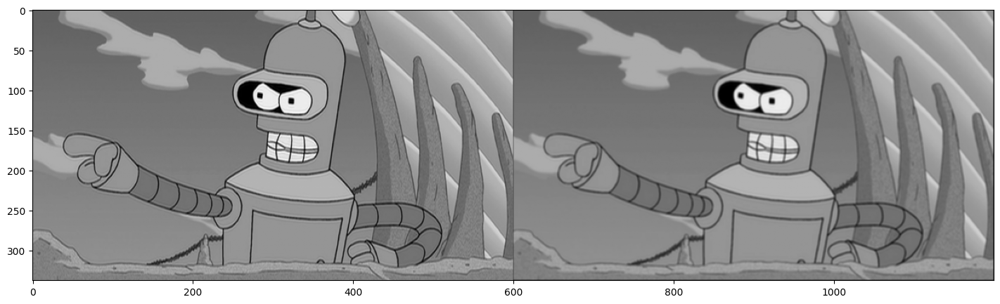

In [ ]:
avg_filter = 1 / 9 * np.ones((3, 3))
smooth_image = generic_convolution(bender_img_gray, avg_filter, cumsum_prod)

out_img = np.zeros((h, 2*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:] = smooth_image
plt.imshow(out_img, cmap="gray")


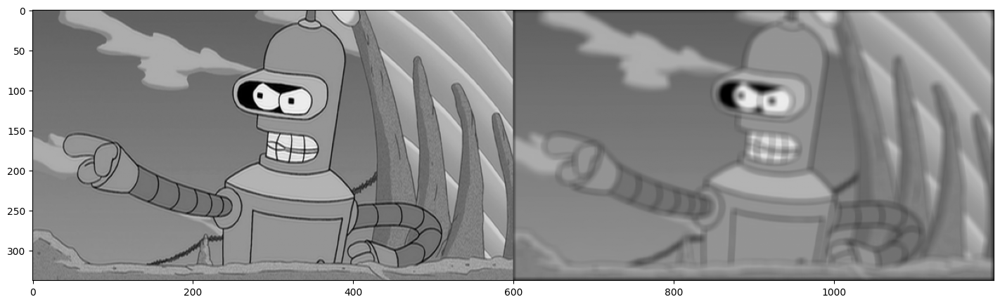

In [ ]:
avg_filter = 1 / 81 * np.ones((9, 9))
smooth_image = generic_convolution(bender_img_gray, avg_filter, cumsum_prod)

out_img = np.zeros((h, 2*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:] = smooth_image
plt.imshow(out_img, cmap="gray")

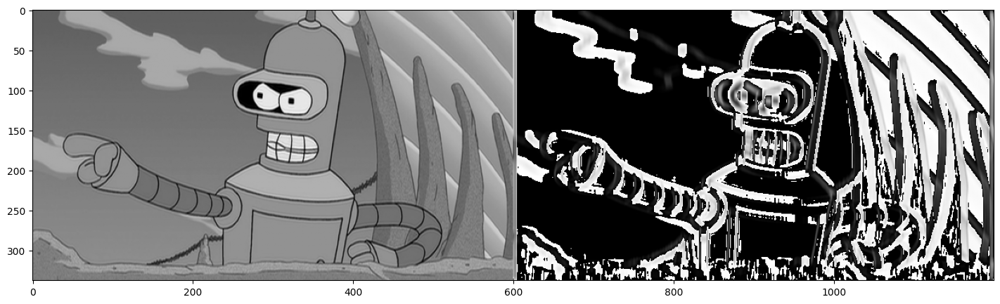

In [ ]:
filt_image = generic_convolution(smooth_image, sobel_filter, cumsum_prod)

out_img = np.zeros((h, 2*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:] = filt_image
plt.imshow(out_img, cmap="gray")

**11. Image Gradients**

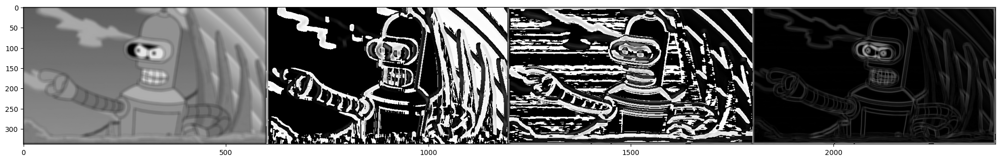

In [ ]:
prewitt_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

gx = generic_convolution(smooth_image, prewitt_x, cumsum_prod)
gy = generic_convolution(smooth_image, prewitt_y, cumsum_prod)
G = np.sqrt(gx ** 2 + gy ** 2)

h, w = smooth_image.shape
out_image = np.zeros((h, 4 * w), dtype=np.uint8)
out_image[:, :w] = smooth_image
out_image[:, w:2*w] = gx
out_image[:, 2*w:3*w] = gy
out_image[:, 3*w:] = G
plt.imshow(out_image, cmap='gray')


**12. Image Denoising**

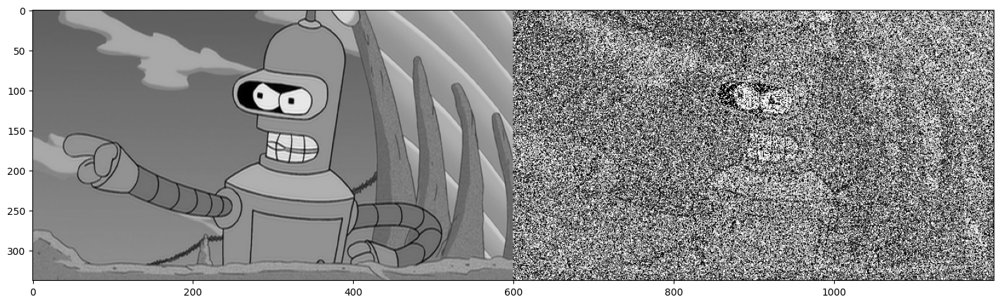

In [ ]:
# the 'salt and pepper' noise
h, w = bender_img_gray.shape
noise  = 2 * 255 *(np.random.rand(h, w) - 0.5) # to -255, 255
noise = np.where(np.abs(noise) < 128.0, 0, noise)
noise = np.where(noise <= -128.0, -255.0, noise)
noise = np.where(noise >= 128.0, 255.0, noise)


bender_img_noisy = np.clip(bender_img_gray + noise, 0, 255)

out_img = np.zeros((h, 2*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:] = bender_img_noisy

plt.imshow(out_img, cmap="gray")

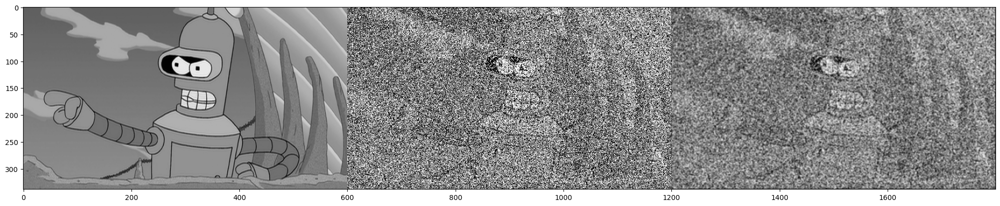

In [ ]:
avg_filter = 1/9 * np.ones((3, 3))
filt_image = generic_convolution(bender_img_noisy, avg_filter, cumsum_prod)

out_img = np.zeros((h, 3*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:2*w] = bender_img_noisy
out_img[:, 2*w:] = filt_image
plt.imshow(out_img, cmap="gray")

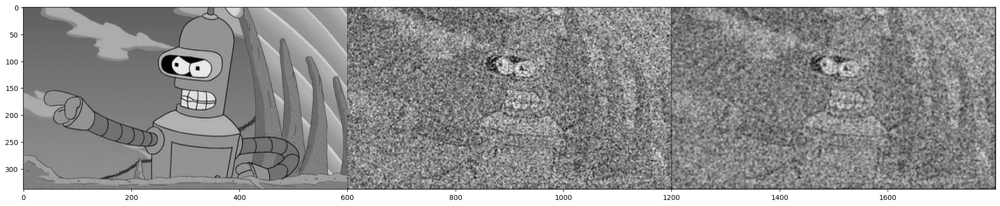

In [ ]:
filt_image_2 = generic_convolution(filt_image, avg_filter, cumsum_prod)

out_img = np.zeros((h, 3*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:2*w] = filt_image
out_img[:, 2*w:] = filt_image_2
plt.imshow(out_img, cmap="gray")

In [ ]:
def get_median(a, b=None):
  h, w  = a.shape
  a_flat = a.flatten()
  a_sorted = np.sort(a_flat)
  return a_sorted[h * w // 2]

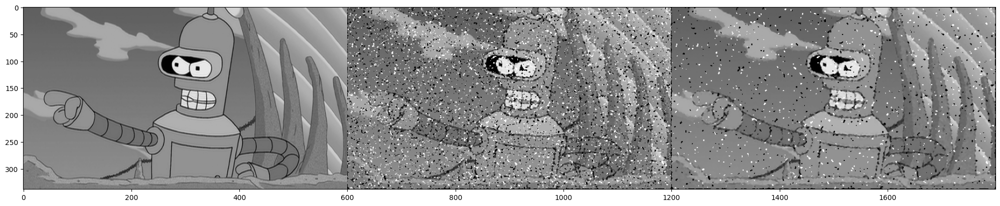

In [ ]:
# send a 3x3 matrix of zero values just to use the convolution operation
# the filter kernel values are not used in the median filter
median_filt_img = generic_convolution(bender_img_noisy, np.zeros((3, 3)), get_median)

out_img = np.zeros((h, 3*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:2*w] = median_filt_img
out_img[:, 2*w:] = generic_convolution(median_filt_img, np.zeros((3, 3)), get_median)
plt.imshow(out_img, cmap="gray")

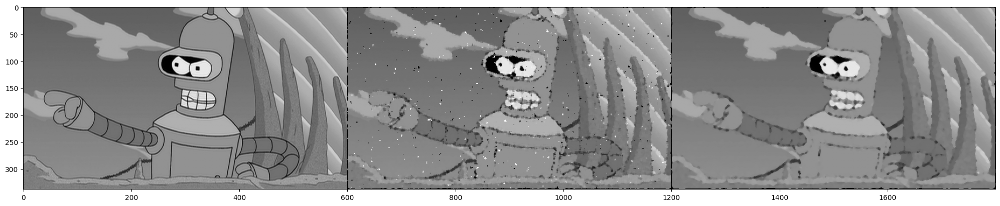

In [ ]:
median_filt_img = generic_convolution(bender_img_noisy, np.zeros((5, 5)), get_median)

out_img = np.zeros((h, 3*w), dtype=np.uint8)
out_img[:, :w] = bender_img_gray
out_img[:, w:2*w] = median_filt_img
out_img[:, 2*w:] = generic_convolution(median_filt_img, np.zeros((5, 5)), get_median)
plt.imshow(out_img, cmap="gray")

Additional resources:

[OpenCV package
](https://docs.opencv.org/3.4/d9/df8/tutorial_root.html)

[Pillow package](https://pillow.readthedocs.io/en/stable/)

[Scikit image package](https://scikit-image.org/)

[Linear Algebra package](https://numpy.org/)

References:

R.C. Gonzalez, Digital Image Processing- 3rd Edition, editura Prentice Hall, New Jersey, SUA, pag. 568-572, 2008

Nixon M.S., Aguado A.S., Feature Extraction and Image Processing for Computer Vision (3ed., AP, 2012)
